# Imitation Game

to create an infinite loop of image generation -> sound/text matching with CLIP -> image generation -> ....

In [1]:
# Run this line in Colab to install the package if it is
# not already installed.
import sys, os
sys.path.append("..")
os.environ["CUDA_VISIBLE_DEVICES"]="0"
#os.environ["CUDA_LAUNCH_BLOCKING"]="1"

In [2]:
%load_ext autoreload
%autoreload 2

In [ ]:
from tqdm import tqdm
import IPython.display as ipd

N_MAX_WORDS = 8


In [3]:
from pysimplendi import NDISender, NDIReceiver
import cv2

ndisender = NDISender("glide")
ndisender2 = NDISender("glide2")
ndireceiver = NDIReceiver()
print(ndireceiver)
# source_list = ndireceiver.getSourceList()
# print(source_list)

# 1. get current frame
frame = ndireceiver.getCurrentFrame()


print(frame.shape)
#print(frame.shape)
# from osc4py3.as_allthreads import *     # does osc_method
# from osc4py3.oscmethod import *         # does OSCARG_XXX
# from osc4py3 import oscmethod as osm

# # Start the system.
# osc_startup()

# # Make server channels to receive packets.
# osc_udp_server("0.0.0.0", 6702, "oscserver1")


(780, 960, 4)


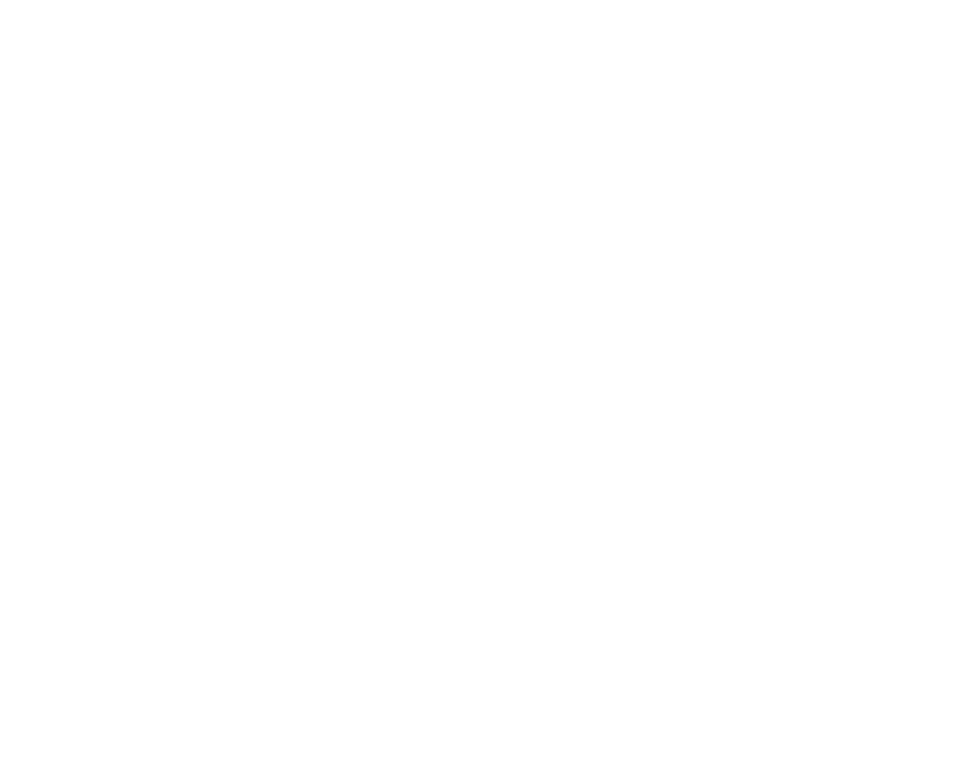

In [4]:
from PIL import Image
from IPython.display import display
ndireceiver.setSource("glide_camera")
frame = ndireceiver.getCurrentFrame()
display(Image.fromarray(frame))

In [5]:
# Super Resolution
# https://github.com/xinntao/Real-ESRGAN
from basicsr.archs.rrdbnet_arch import RRDBNet

from realesrgan import RealESRGANer
from realesrgan.archs.srvgg_arch import SRVGGNetCompact

#%%

modelpath = "../../Real-ESRGAN/experiments/pretrained_models/RealESRGAN_x4plus.pth"

model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=4)
netscale = 4
upsampler = RealESRGANer(
    scale=netscale,
    model_path=modelpath,
    model=model,
    tile=0,
    tile_pad=10,
    pre_pad=0,
    half=True)

def upscale(img):
    output, _ = upsampler.enhance(img, outscale=netscale)
    return output

In [6]:
from PIL import Image
from IPython.display import display
import torch as th
import torch.nn as nn

from glide_text2im.clip.model_creation import create_clip_model
from glide_text2im.download import load_checkpoint
from glide_text2im.model_creation import (
    create_model_and_diffusion,
    model_and_diffusion_defaults,
    model_and_diffusion_defaults_upsampler,
)
from glide_text2im.tokenizer.simple_tokenizer import SimpleTokenizer

In [7]:
# This notebook supports both CPU and GPU.
# On CPU, generating one sample may take on the order of 20 minutes.
# On a GPU, it should be under a minute.

has_cuda = th.cuda.is_available()
device = th.device('cpu' if not has_cuda else 'cuda')

In [8]:
# Create base model.
options = model_and_diffusion_defaults()
options['use_fp16'] = has_cuda
options['timestep_respacing'] = '100' # use 100 diffusion steps for fast sampling
model, diffusion = create_model_and_diffusion(**options)
model.eval()
if has_cuda:
    model.convert_to_fp16()
model.to(device)
model.load_state_dict(load_checkpoint('base', device))
print('total base parameters', sum(x.numel() for x in model.parameters()))

total base parameters 385030726


In [9]:
# Create upsampler model.
options_up = model_and_diffusion_defaults_upsampler()
options_up['use_fp16'] = has_cuda
options_up['timestep_respacing'] = 'fast27' # use 27 diffusion steps for very fast sampling
model_up, diffusion_up = create_model_and_diffusion(**options_up)
model_up.eval()
if has_cuda:
    model_up.convert_to_fp16()
model_up.to(device)
model_up.load_state_dict(load_checkpoint('upsample', device))
print('total upsampler parameters', sum(x.numel() for x in model_up.parameters()))

total upsampler parameters 398361286


In [10]:
# Create CLIP model.
clip_model = create_clip_model(device=device)
clip_model.image_encoder.load_state_dict(load_checkpoint('clip/image-enc', device))
clip_model.text_encoder.load_state_dict(load_checkpoint('clip/text-enc', device))

<All keys matched successfully>

In [11]:
def show_images(batch: th.Tensor):
    img = convert_torch_to_image(batch)
    display(img)
    
def convert_torch_to_image(batch: th.Tensor):
    scaled = ((batch + 1)*127.5).round().clamp(0,255).to(th.uint8).cpu()
    reshaped = scaled.permute(2, 0, 3, 1).reshape([batch.shape[2], -1, 3])
    return Image.fromarray(reshaped.numpy())

In [12]:
# Sampling parameters
prompt = "an origami of a santa claus"
batch_size = 1
guidance_scale = 3.0

# Tune this parameter to control the sharpness of 256x256 images.
# A value of 1.0 is sharper, but sometimes results in grainy artifacts.
upsample_temp = 0.997

In [13]:
##############################
# Sample from the base model #
##############################

#     # Create the text tokens to feed to the model.
# tokens = model.tokenizer.encode(prompt)
# tokens, mask = model.tokenizer.padded_tokens_and_mask(
#     tokens, options['text_ctx']
# )

# # Pack the tokens together into model kwargs.
# model_kwargs = dict(
#     tokens=th.tensor([tokens] * batch_size, device=device),
#     mask=th.tensor([mask] * batch_size, dtype=th.bool, device=device),
# )

# # Setup guidance function for CLIP model.
# cond_fn = clip_model.cond_fn([prompt] * batch_size, guidance_scale)

# # Sample from the base model.
# model.del_cache()

# samples = diffusion.p_sample_loop(
#     model,
#     (batch_size, 3, options["image_size"], options["image_size"]),
#     device=device,
#     clip_denoised=True,
#     progress=False,
#     model_kwargs=model_kwargs,
#     cond_fn=cond_fn,
#     ndisender=ndisender
# )

# model.del_cache()

# # Show the output
# show_images(samples)


In [33]:
def get_new_conditioning(prompt, z_t):
    # Create the text tokens to feed to the model.
    tokens = model.tokenizer.encode(prompt)
    tokens, mask = model.tokenizer.padded_tokens_and_mask(
        tokens, options['text_ctx']
    )

    # Pack the tokens together into model kwargs.
    model_kwargs = dict(
        tokens=th.tensor([tokens] * batch_size, device=device),
        mask=th.tensor([mask] * batch_size, dtype=th.bool, device=device),
    )

    # Setup guidance function for CLIP model.
    if z_t is None:
        cond_fn = clip_model.cond_fn([prompt] * batch_size, guidance_scale)
    else:
        cond_fn = clip_model.cond_fn_with_z([prompt] * batch_size, guidance_scale, z_t)
    return cond_fn, model_kwargs


def p_sample_loop_progressive(
        diffusion,
        model,
        shape,
        noise=None,
        clip_denoised=True,
        denoised_fn=None,
        device=None,
        progress=False,
        start_index = 0,
        noise_ratio = 0.0,
        prompt_text = None,
        audio_embed = None
    ):
    if device is None:
        device = next(model.parameters()).device
    assert isinstance(shape, (tuple, list))
    if noise is not None:
        img = noise + th.randn(*shape, device=device) * noise_ratio
    else:
        img = th.randn(*shape, device=device) 
    indices = list(range(diffusion.num_timesteps))[::-1]
    indices.extend(indices[::-3]) # backwards

    if progress:
        # Lazy import so that we don't depend on tqdm.
        from tqdm.auto import tqdm
        indices = tqdm(indices)
    
    cond_fn, model_kwargs = get_new_conditioning(prompt_text, z_t = audio_embed)  
    
    index = 0

    #while True:
    for index in indices[start_index:]:
        t = th.tensor([index] * shape[0], device=device)

        #osc_process()            
        index += 1
        
        with th.no_grad():                
            out = diffusion.p_sample(
                model,
                img,
                t,
                clip_denoised=clip_denoised,
                denoised_fn=denoised_fn,
                cond_fn=cond_fn,
                model_kwargs=model_kwargs,
            )
            yield index, out 
            img = out["sample"]
            
        # NDI
        batch = img #list(samples)["sample"]
        scaled = ((batch + 1)*127.5).round().clamp(0,255).to(th.uint8).cpu()
        reshaped = scaled.permute(2, 0, 3, 1).reshape([batch.shape[2], -1, 3])
        reshaped = reshaped[:,:,[2,1,0]]
#        ndisender2.send(reshaped.numpy())
        
        # upscaling
        upscaled = upscale(reshaped.numpy())
        ndisender2.send(upscaled)
        

In [31]:
# ##############################
# # Sample from the base model #
# ##############################

# cond_fn, model_kwargs = get_new_conditioning(prompt)

# # Sample from the base model.
# #model.del_cache()

# # samples = diffusion.p_sample_loop(
# #     model,
# #     (batch_size, 3, options["image_size"], options["image_size"]),
# #     device=device,
# #     clip_denoised=True,
# #     progress=False,
# #     model_kwargs=model_kwargs,
# #     cond_fn=cond_fn,
# #     ndisender=ndisender
# # )

# def prompt_handler(text):
#     global cond_fn, model_kwargs, prompt
#     prompt = text
#     print("new prompt:", text)
#     #
# osc_method("/prompt", prompt_handler) #, argscheme=osm.OSCARG_ADDRESS + osm.OSCARG_DATAUNPACK)

# # Periodically call osc4py3 processing method in your event loop.




In [16]:
import numpy as np

text_embeds = np.load("./tmp/text_caption.npz")['embed']
texts_list = np.load("./tmp/text_caption.npz")['texts']
print(text_embeds.shape)

from glob import glob
filepaths = glob("../../../../Datasets/Audio/ImaginarySoundscape_sound/*.mp3")
print(len(filepaths))

audio_embeds = np.load("./tmp/imaginarysoundscape_audio_embeds.npz")['embed']
audio_filepaths = np.load("./tmp/imaginarysoundscape_audio_embeds.npz")['filepaths']

(3318332, 512)
56485


In [ ]:
from glob import glob
filepaths = glob("../../../../Datasets/Audio/Freesound/Freesound_caption/development/*.wav")
print(len(filepaths))

In [17]:
import random
indices = list(range(text_embeds.shape[0]))
indices = random.sample(indices, 1000000)
text_embeds = text_embeds[indices]
texts_list = texts_list[indices]

In [38]:
# %% GET EMBEDDINGS
import wav2clip
import librosa 
from sklearn.metrics.pairwise import cosine_distances
import numpy as np
import clip

w2c_model = wav2clip.get_model()
base_clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

def get_best_fit_text_to_audio(audiopath, embeds, texts, topK=1, distance_func = cosine_distances):
    y, sr = librosa.load(audiopath, sr=16000, mono=True)
    e = wav2clip.embed_audio(y, w2c_model)
    #e = e / (np.linalg.norm(e, axis=-1, keepdims=True) + 1e-12)
    sims = distance_func(embeds, e)
    index = np.argsort(sims, axis=0).squeeze()[:topK]
    return texts[index], e, embeds[index]

def get_best_fit_audio_to_image(img, embeds, paths, topK=1, distance_func = cosine_distances):
    img = clip_preprocess(img).unsqueeze(0).to(device)
    with th.no_grad():
#        image_features = clip_model.image_embeddings(img, th.tensor(0).to(device))
        image_features = base_clip_model.encode_image(img).cpu().numpy()
    #image_features = image_features / (np.linalg.norm(image_features, axis=-1, keepdims=True) + 1e-12)
    sims = distance_func(embeds, image_features)
    index = np.argsort(sims, axis=0).squeeze()[:topK]
    return paths[index], image_features

def get_best_fit_text_to_image(img, embeds, texts, topK=1, distance_func = cosine_distances):
    img = clip_preprocess(img).unsqueeze(0).to(device)
    with th.no_grad():
#        image_features = clip_model.image_embeddings(img, th.tensor(0).to(device))
        image_features = base_clip_model.encode_image(img).cpu().numpy() 
    
    #image_features = image_features / (np.linalg.norm(image_features, axis=-1, keepdims=True) + 1e-12) 
    dist = distance_func(embeds, image_features)
    index = np.argsort(dist, axis=0).squeeze()[:topK]
    return texts[index], image_features

In [19]:

# audiopaths = [] 
# prompts = []
# clip_embeds = []
# for _ in tqdm(range(5)):
#     audiopath = random.choice(filepaths)
#     audiopaths.append(audiopath)
#     ipd.display(ipd.Audio(audiopath))
#     prompt, e, text_embed = get_best_fit_text_to_audio(audiopath,text_embeds,texts_list)
#     prompt = str(prompt[0])
#     print(prompt)
    
#     prompt = " ".join(prompt.split()[:N_MAX_WORDS])
#     print(prompt)
    
#     prompts.append(prompt)
#     clip_embeds.append(text_embed)


synthpop artist live on stage


z_t: tensor([ 0.0123,  0.0201,  0.0407, -0.0018, -0.0138, -0.0130, -0.0043, -0.0081,
         0.0005,  0.0301,  0.0017,  0.0065,  0.0042,  0.0004, -0.0193,  0.0175,
         0.0097,  0.0136,  0.0145, -0.0007, -0.0047, -0.0097,  0.0092,  0.0050,
         0.0127, -0.0038,  0.0026, -0.0019, -0.0094, -0.0055], device='cuda:0')


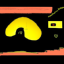

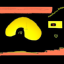

people walk along national register of historic places


z_t: tensor([-0.0035,  0.0078,  0.0176,  0.0014, -0.0237, -0.0078, -0.0127, -0.0043,
         0.0366,  0.0469,  0.0118, -0.0137,  0.0099, -0.0039, -0.0163, -0.0079,
        -0.0051, -0.0113,  0.0152, -0.0090, -0.0091, -0.0028,  0.0030,  0.0200,
         0.0187,  0.0212,  0.0141,  0.0166,  0.0098,  0.0144], device='cuda:0')


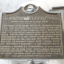

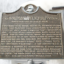

late gothic revival structure by architect , statue


z_t: tensor([-0.0133,  0.0015, -0.0012,  0.0182, -0.0108,  0.0049, -0.0063,  0.0342,
         0.0290,  0.0494, -0.0385, -0.0262, -0.0217,  0.0036,  0.0193,  0.0091,
        -0.0262,  0.0017, -0.0234,  0.0045,  0.0072, -0.0030,  0.0020, -0.0059,
         0.0256,  0.0205,  0.0233, -0.0081,  0.0140, -0.0107], device='cuda:0')


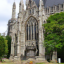

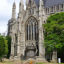

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


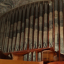

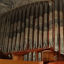

statue of politician stands in the metal foundry


z_t: tensor([-0.0304,  0.0261,  0.0284,  0.0167, -0.0103,  0.0109, -0.0015, -0.0182,
        -0.0167,  0.0570,  0.0029, -0.0338, -0.0245, -0.0096,  0.0044,  0.0107,
        -0.0152,  0.0168,  0.0066, -0.0316,  0.0048,  0.0099,  0.0256, -0.0351,
        -0.0001, -0.0167,  0.0150,  0.0210,  0.0241,  0.0183], device='cuda:0')


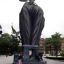

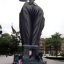

late gothic revival structure by architect , statue


z_t: tensor([-0.0133,  0.0015, -0.0012,  0.0182, -0.0108,  0.0049, -0.0063,  0.0342,
         0.0290,  0.0494, -0.0385, -0.0262, -0.0217,  0.0036,  0.0193,  0.0091,
        -0.0262,  0.0017, -0.0234,  0.0045,  0.0072, -0.0030,  0.0020, -0.0059,
         0.0256,  0.0205,  0.0233, -0.0081,  0.0140, -0.0107], device='cuda:0')


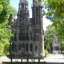

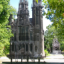

pipe organ in the church in city


z_t: tensor([ 0.0452, -0.0432,  0.0113,  0.0234, -0.0061,  0.0041,  0.0189,  0.0607,
        -0.0418,  0.0514, -0.0386, -0.0281, -0.0079,  0.0252,  0.0096,  0.0153,
         0.0203, -0.0060,  0.0408,  0.0395, -0.0065, -0.0123,  0.0105,  0.0315,
        -0.0203,  0.0069, -0.0068,  0.0094,  0.0070,  0.0044], device='cuda:0')


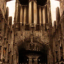

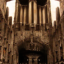

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


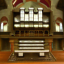

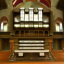

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


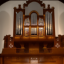

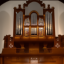

person at the world famous organ .


z_t: tensor([ 0.0421, -0.0209,  0.0416,  0.0217,  0.0067, -0.0061, -0.0039,  0.0373,
        -0.0440,  0.0464, -0.0212, -0.0188, -0.0064, -0.0121,  0.0148,  0.0235,
         0.0329, -0.0343,  0.0449,  0.0264,  0.0009,  0.0006,  0.0285,  0.0225,
        -0.0050,  0.0025,  0.0024,  0.0083,  0.0048, -0.0240], device='cuda:0')


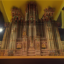

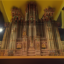

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


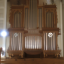

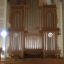

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


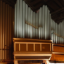

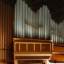

person at the world famous organ .


z_t: tensor([ 0.0421, -0.0209,  0.0416,  0.0217,  0.0067, -0.0061, -0.0039,  0.0373,
        -0.0440,  0.0464, -0.0212, -0.0188, -0.0064, -0.0121,  0.0148,  0.0235,
         0.0329, -0.0343,  0.0449,  0.0264,  0.0009,  0.0006,  0.0285,  0.0225,
        -0.0050,  0.0025,  0.0024,  0.0083,  0.0048, -0.0240], device='cuda:0')


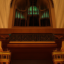

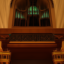

person at the world famous organ .


z_t: tensor([ 0.0421, -0.0209,  0.0416,  0.0217,  0.0067, -0.0061, -0.0039,  0.0373,
        -0.0440,  0.0464, -0.0212, -0.0188, -0.0064, -0.0121,  0.0148,  0.0235,
         0.0329, -0.0343,  0.0449,  0.0264,  0.0009,  0.0006,  0.0285,  0.0225,
        -0.0050,  0.0025,  0.0024,  0.0083,  0.0048, -0.0240], device='cuda:0')


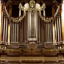

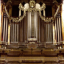

pipe organ in church in the city .


z_t: tensor([ 0.0448, -0.0465,  0.0165,  0.0183, -0.0037, -0.0012,  0.0161,  0.0571,
        -0.0388,  0.0519, -0.0406, -0.0269, -0.0125,  0.0223,  0.0130,  0.0136,
         0.0162, -0.0077,  0.0390,  0.0390, -0.0013, -0.0153,  0.0032,  0.0328,
        -0.0217,  0.0127, -0.0059,  0.0084,  0.0096, -0.0051], device='cuda:0')


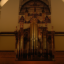

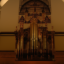

the pipe organ inside the cathedral .


z_t: tensor([ 0.0505, -0.0496,  0.0097,  0.0197,  0.0014,  0.0149,  0.0195,  0.0613,
        -0.0377,  0.0516, -0.0339, -0.0251, -0.0094,  0.0221,  0.0028,  0.0192,
         0.0151, -0.0200,  0.0302,  0.0365, -0.0114,  0.0035,  0.0064,  0.0465,
        -0.0143,  0.0173, -0.0018,  0.0062, -0.0046,  0.0036], device='cuda:0')


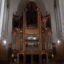

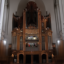

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


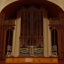

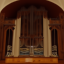

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


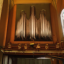

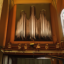

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


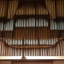

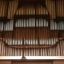

person at the world famous organ .


z_t: tensor([ 0.0421, -0.0209,  0.0416,  0.0217,  0.0067, -0.0061, -0.0039,  0.0373,
        -0.0440,  0.0464, -0.0212, -0.0188, -0.0064, -0.0121,  0.0148,  0.0235,
         0.0329, -0.0343,  0.0449,  0.0264,  0.0009,  0.0006,  0.0285,  0.0225,
        -0.0050,  0.0025,  0.0024,  0.0083,  0.0048, -0.0240], device='cuda:0')


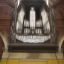

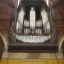

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


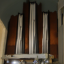

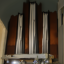

a historic pipe organ in church


z_t: tensor([ 0.0493, -0.0355,  0.0186,  0.0128, -0.0042,  0.0010,  0.0256,  0.0512,
        -0.0407,  0.0502, -0.0511, -0.0193, -0.0004,  0.0260,  0.0174,  0.0141,
         0.0235, -0.0057,  0.0319,  0.0401, -0.0100, -0.0119,  0.0072,  0.0198,
        -0.0277,  0.0047, -0.0004,  0.0097, -0.0028, -0.0077], device='cuda:0')


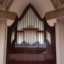

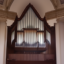

jazz artist plays organ as he records an


z_t: tensor([ 0.0075,  0.0030,  0.0280,  0.0087, -0.0061, -0.0131,  0.0222,  0.0125,
        -0.0275,  0.0412, -0.0054, -0.0024, -0.0062, -0.0168,  0.0023,  0.0273,
         0.0008,  0.0039,  0.0257,  0.0219, -0.0145,  0.0049,  0.0067,  0.0047,
        -0.0029, -0.0106,  0.0002,  0.0206, -0.0046,  0.0034], device='cuda:0')


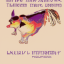

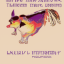

woman hands frees the bird above a wire


z_t: tensor([-0.0347,  0.0193, -0.0348, -0.0121, -0.0116,  0.0313, -0.0015, -0.0378,
        -0.0234,  0.0372, -0.0027,  0.0041,  0.0073, -0.0153,  0.0077,  0.0130,
         0.0053,  0.0181, -0.0552, -0.0060, -0.0037, -0.0038, -0.0007, -0.0147,
        -0.0143, -0.0287,  0.0337,  0.0382,  0.0046, -0.0081], device='cuda:0')


KeyboardInterrupt: 

In [39]:
import IPython.display as ipd
import warnings
import random

warnings.filterwarnings("ignore")

preprompt = ""
batch_size = 1

# initial input
audiopath = random.choice(list(audio_filepaths))
audiopath = "../../" + audiopath

while True:
#for prompt, embed, audiopath in zip(prompts, clip_embeds, audiopaths):
    prompt, audio_embed, text_embed = get_best_fit_text_to_audio(audiopath,text_embeds,texts_list)
    prompt = prompt[0]
    #prompt, audio_embed, text_embed = get_best_fit_text_to_audio(audiopath,text_embeds,texts_list)
    prompt = preprompt + " ".join(str(prompt).split()[:N_MAX_WORDS])
    print(prompt)
    
    ipd.display(ipd.Audio(audiopath, autoplay=True))
    
    final_img = None
    current_img = None
    for index, sample in p_sample_loop_progressive(diffusion, 
            model,
            (batch_size, 3, options["image_size"], options["image_size"]),
            noise=current_img,
            clip_denoised=True,
            denoised_fn=None,
            device=device,
            progress=False,
            start_index=0,
            noise_ratio=0.2,
            prompt_text = prompt,
            audio_embed = None #th.Tensor(audio_embed).to(device)
        ): 
        current_img = sample["sample"]
        
        if index == 1:
            final_img = current_img
            show_images(final_img)
    
    # next audio path
    audiopath, audio_embed = get_best_fit_audio_to_image(convert_torch_to_image(final_img), audio_embeds, audio_filepaths)
    audiopath = audiopath[0]
    audiopath = "../../" + audiopath
#     prompt, _ = get_best_fit_text_to_image(convert_torch_to_image(final_img), text_embeds, texts_list)
#     prompt = prompt[0]
    # Properly close the system.
    # osc_terminate()
    #model.del_cache()

 #   # Show the output
  #  show_images(current_img)

In [ ]:
def prompt_handler(text):
    global cond_fn, model_kwargs, prompt
    prompt = text
    print("new prompt:", text)
    #
osc_method("/prompt", prompt_handler) #, argscheme=osm.OSCARG_ADDRESS + osm.OSCARG_DATAUNPACK)

while True:
    osc_process()

In [ ]:
osc_terminate()

In [ ]:
# Sampling parameters
prompt = "colorful crayon drawing of a xsmas tree drawn by picasso"
batch_size = 6
guidance_scale = 3.0

# Tune this parameter to control the sharpness of 256x256 images.
# A value of 1.0 is sharper, but sometimes results in grainy artifacts.
upsample_temp = 0.997

In [ ]:
# ##############################
# # Sample from the base model #
# ##############################

def get_new_conditioning(prompt):
    # Create the text tokens to feed to the model.
    tokens = model.tokenizer.encode(prompt)
    tokens, mask = model.tokenizer.padded_tokens_and_mask(
        tokens, options['text_ctx']
    )

    # Pack the tokens together into model kwargs.
    model_kwargs = dict(
        tokens=th.tensor([tokens] * batch_size, device=device),
        mask=th.tensor([mask] * batch_size, dtype=th.bool, device=device),
    )

    # Setup guidance function for CLIP model.
    cond_fn = clip_model.cond_fn([prompt] * batch_size, guidance_scale)
    return cond_fn, model_kwargs

cond_fn, model_kwargs = get_new_conditioning(prompt)

# Sample from the base model.
model.del_cache()

samples = diffusion.p_sample_loop(
    model,
    (batch_size, 3, options["image_size"], options["image_size"]),
    device=device,
    clip_denoised=True,
    progress=True,
    model_kwargs=model_kwargs,
    cond_fn=cond_fn,
    ndisender=ndisender
)

# def prompt_handler(text):
#     global cond_fn, model_kwargs, prompt
#     prompt = text
#     print("new prompt:", text)
#     #
# osc_method("/prompt", prompt_handler) #, argscheme=osm.OSCARG_ADDRESS + osm.OSCARG_DATAUNPACK)

# # Periodically call osc4py3 processing method in your event loop.
model.del_cache()

# Show the output
show_images(samples)

##############################
# Upsample the 64x64 samples #
##############################

tokens = model_up.tokenizer.encode(prompt)
tokens, mask = model_up.tokenizer.padded_tokens_and_mask(
    tokens, options_up['text_ctx']
)

# Create the model conditioning dict.
model_kwargs = dict(
    # Low-res image to upsample.
    low_res=((samples+1)*127.5).round()/127.5 - 1,

    # Text tokens
    tokens=th.tensor(
        [tokens] * batch_size, device=device
    ),
    mask=th.tensor(
        [mask] * batch_size,
        dtype=th.bool,
        device=device,
    ),
)

# Sample from the base model.
model_up.del_cache()
up_shape = (batch_size, 3, options_up["image_size"], options_up["image_size"])
up_samples = diffusion_up.ddim_sample_loop(
    model_up,
    up_shape,
    noise=th.randn(up_shape, device=device) * upsample_temp,
    device=device,
    clip_denoised=True,
    progress=True,
    model_kwargs=model_kwargs,
    cond_fn=None,
)[:batch_size]
model_up.del_cache()

# Show the output
show_images(up_samples)